<a href="https://colab.research.google.com/github/ktw-98/Portfolio/blob/main/Soft_landing_guidance.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
#!pip install ECOS
import numpy as np
import matplotlib.pyplot as plt
import scipy.sparse as sp
import scipy.sparse.linalg as sla

import jax
import jax.numpy as jnp
from tqdm import tqdm
import cvxpy as cp

시뮬레이션 파라미터

In [2]:
N = 200
T = 20
ts = np.linspace(0, T, N+1)
h = T / N

gamma = 0.05
g = 9.8

n = 6   # state dim
m = 3   # control dim

x0 = np.array([500, 200, 2000, 40, -10, -300])

#1. Least-squre 방식

1.1 최적화 식 파라미터 구현

- 상태 공간 방정식

$$
  x_{t+1} = Ax_t + Bu_t + b
$$

- 가중치 $Q_t, Q_N, R, \rho$ 설정
  - $rho$ : 동역학 잔차 가중치 - 얼마나 동역학을 따르게 할지 결정

> 인용구 추가



In [3]:
I3 = np.eye(3)

A = np.block([
    [I3, (1 - gamma*h/2)*h*I3],
    [np.zeros((3,3)), (1 - gamma*h)*I3]
])

B = np.block([
    [(h**2)/2 * I3],
    [h * I3]
])

b = np.array([0, 0, -0.5*g*h**2, 0, 0, -g*h])

Q_list = []
for t in range(N):
    alpha = np.exp(-(N - t)/250)       # 후반으로 갈 수록 커짐
    Q_list.append(alpha * np.diag([1/alpha/alpha, 1/alpha/alpha, 0, 10/alpha/alpha, 10/alpha/alpha, 0]))
Q_N = np.diag([10, 10, 100, 100, 100, 1000])

R = np.eye(3)

# 동역학 잔차 가중치
rho = 1e3

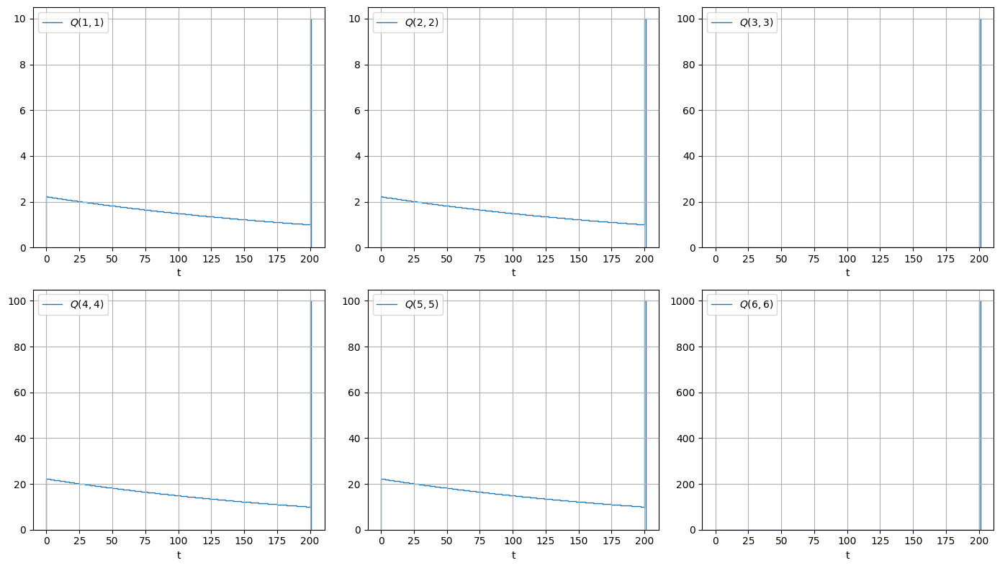

In [4]:
labels_x = [r'$p_e$', r'$p_n$', r'$p_u$', r'$v_e$', r'$v_n$', r'$v_u$']

Q_all = Q_list + [Q_N]

plt.figure(figsize=(14,8), dpi=100)
for i in range(6):
    plt.subplot(2,3,i+1)
    plt.stairs([Q_all[t][i,i] for t in range(N+1)],
               label=rf'$Q({i+1},{i+1})$')
    plt.grid(); plt.legend(); plt.xlabel('t')
plt.tight_layout()
plt.show()


1.2 $y$ 스태킹
$$
  y = [x_1, ... , x_N, u_0, ... , u_{N-1}]^T x \in \mathbb{R}^{9N}
$$

In [5]:
dim_x = 6
dim_u = 3
dim_y = (dim_x + dim_u) * N   # 9N = 1800

def idx_x(t):
    # x_t for t=1..N  (x0는 변수에 없음)
    s = (t-1) * dim_x
    return slice(s, s + dim_x)

def idx_u(t):
    # u_t for t=0..N-1
    base = dim_x * N
    s = base + t * dim_u
    return slice(s, s + dim_u)


def unpack_y(y):
  x = np.zeros((dim_x, N+1))
  u = np.zeros((dim_u, N))
  x[:, 0] = x0
  for t in range(1, N+1):
    x[:, t] = y[idx_x(t)]
  for t in range(N):
    u[:, t] = y[idx_u(t)]
  return x, u

def pack_y(x, u):
    y = np.zeros(dim_y)
    # x1..xN
    for t in range(1, N+1):
        y[idx_x(t)] = x[:, t]
    # u0..u_{N-1}
    for t in range(N):
        y[idx_u(t)] = u[:, t]
    return y


In [6]:
print("N =", N)
print("dim_x, dim_u =", dim_x, dim_u)
print("dim_y =", dim_y)

print("idx_x(N) =", idx_x(N))
print("idx_u(N-1) =", idx_u(N-1))


N = 200
dim_x, dim_u = 6 3
dim_y = 1800
idx_x(N) = slice(1194, 1200, None)
idx_u(N-1) = slice(1797, 1800, None)


1.3 LS 구성 (scipy.sparse 사용)

$$
\begin{aligned}
\min_{\{x_t,u_t\}} \quad
& \sum_{t=1}^{N-1} \left\| Q^{1/2} x_t \right\|_2^2
+ \left\| Q_N^{1/2} (x_N - x_{\text{des}}) \right\|_2^2 \\
&\quad + \sum_{t=0}^{N-1} \left\| R^{1/2} u_t \right\|_2^2
+ \rho \sum_{t=0}^{N-1} \left\| x_{t+1} - A x_t - B u_t - b \right\|_2^2
\end{aligned}
$$

In [7]:
def sqrt_diag_sparse(M):
    d = np.diag(M).copy()
    d = np.maximum(d, 0.0)
    return sp.diags(np.sqrt(d), format="csr")


def build_Gx_cx_sparse(x_des=None):
    if x_des is None:
        x_des = np.zeros(dim_x)

    blocks = []

    # running terms for x1..x_{N-1}
    for t in range(1, N):
        W = sqrt_diag_sparse(Q_list[t])   # (6,6)
        row = sp.lil_matrix((dim_x, dim_y))
        row[:, idx_x(t)] = W
        blocks.append(row.tocsr())

    # terminal term xN - x_des
    WN = sqrt_diag_sparse(Q_N)
    row = sp.lil_matrix((dim_x, dim_y))
    row[:, idx_x(N)] = WN
    blocks.append(row.tocsr())

    Gx = sp.vstack(blocks, format="csr")

    cx = np.zeros(Gx.shape[0], dtype=float)
    cx[-dim_x:] = (WN @ x_des)  # last block only

    return Gx, cx

def build_Gu_cu_sparse():
    blocks = []
    WR = sqrt_diag_sparse(R)  # if R=I, this is I

    for t in range(N):
        row = sp.lil_matrix((dim_u, dim_y))
        row[:, idx_u(t)] = WR
        blocks.append(row.tocsr())

    Gu = sp.vstack(blocks, format="csr")
    cu = np.zeros(Gu.shape[0], dtype=float)
    return Gu, cu

def build_D_d_sparse():
    D = sp.lil_matrix((dim_x * N, dim_y))
    d = np.zeros(dim_x * N, dtype=float)

    A_sp = sp.csr_matrix(A)
    B_sp = sp.csr_matrix(B)
    I6   = sp.eye(dim_x, format="csr")

    for t in range(N):
        rows = slice(t*dim_x, (t+1)*dim_x)

        # + x_{t+1}  (note: x_{t+1} is x1..xN in y)
        D[rows, idx_x(t+1)] = I6

        # -A x_t
        if t >= 1:
            D[rows, idx_x(t)] = D[rows, idx_x(t)] - A_sp
        else:
            # move -A x0 to RHS
            d[rows] += A @ x0

        # -B u_t
        D[rows, idx_u(t)] = D[rows, idx_u(t)] - B_sp

        # -b  (move to RHS)
        d[rows] += b

    return D.tocsr(), d


In [8]:
x_des = np.zeros(dim_x)

Gx, cx = build_Gx_cx_sparse(x_des=x_des)
Gu, cu = build_Gu_cu_sparse()
D, d_vec = build_D_d_sparse()

A_ls = sp.vstack([Gx, Gu, np.sqrt(rho)*D], format="csr")
b_ls = np.concatenate([cx, cu, np.sqrt(rho)*d_vec])

1.4 LS 풀기 (sla.lsqr 사용)

In [9]:
lsqr_out = sla.lsqr(A_ls, b_ls, atol=1e-10, btol=1e-10, iter_lim=5000)
y_ls = lsqr_out[0]

X_ls, U_ls = unpack_y(y_ls)

print("LS terminal position:", X_ls[:3, -1])
print("LS terminal velocity:", X_ls[3:, -1])
print("LS min p_u:", np.min(X_ls[2,1:]))

# (optional) dynamics residual check
dyn_res = D @ y_ls - d_vec
print("||dynamics residual||:", np.linalg.norm(dyn_res))


LS terminal position: [ 0.04099774  0.0159465  -0.15969852]
LS terminal velocity: [-0.00123344 -0.00047965 -0.09784695]
LS min p_u: -0.15969852112268135
||dynamics residual||: 63.879104543534574


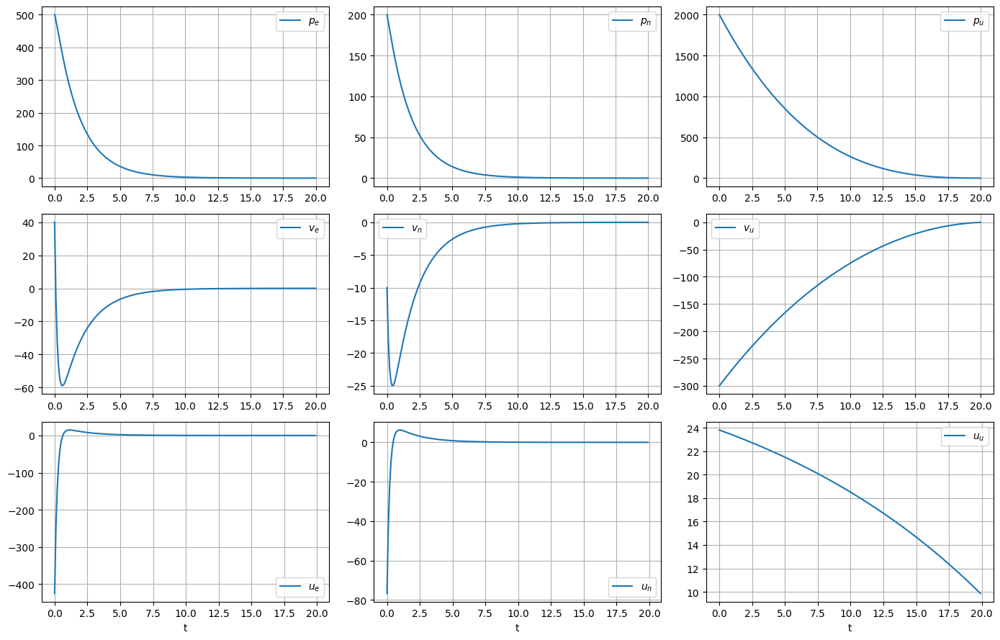

In [10]:
labels = [r'$p_e$',r'$p_n$',r'$p_u$',r'$v_e$',r'$v_n$',r'$v_u$',
          r'$u_e$',r'$u_n$',r'$u_u$']

plt.figure(figsize=(14,9), dpi=100)
for i in range(6):
    plt.subplot(3,3,i+1)
    plt.plot(ts, X_ls[i], label=labels[i])
    plt.grid();
    plt.legend()
for i in range(3):
    plt.subplot(3,3,i+7)
    plt.plot(ts[:-1], U_ls[i], label=labels[i+6])
    plt.grid();
    plt.legend();
    plt.xlabel('t')
plt.tight_layout()
plt.show()


# 2. PGD (Projected Gradient Descent)

2.1 제약 projection
- 제어 입력 제약 :
$
  u_{min} ≤ u_t ≤u_{max}
$

In [11]:
# ====== (Problem 4) Projection onto feasible set: control box constraints only ======
u_min = np.array([-15, -15, 0.0], dtype=float)   # 네가 쓰던 값이면 이걸로
u_max = np.array([ 15,  15, 30.0], dtype=float)

def project_onto_feasible_set(y):
    y2 = y.copy()
    for t in range(N):
        su = idx_u(t)
        y2[su] = np.clip(y2[su], u_min, u_max)
    return y2

2.2 objective f(y)
- $y \rightarrow x, u$로 풀어서 비용과 잔차를 직접 계산
- $x_{des} = [0, 0, 0, 0, 0, 0]$

In [12]:
# ====== Make dense for JAX gradient ======
A_ls_dense = A_ls.toarray().astype(np.float64)   # (rows, 9N)
b_ls_dense = b_ls.astype(np.float64)             # (rows,)

A_j = jnp.array(A_ls_dense)
b_j = jnp.array(b_ls_dense)

@jax.jit
def f_jax(y):
    # y: (9N,)
    r = A_j @ y - b_j
    return jnp.dot(r, r)  # ||r||^2

grad_f = jax.jit(jax.grad(f_jax))

In [13]:
y_test = y_ls.copy()
g_test = np.array(grad_f(jnp.array(y_test)))
print("||grad|| at y_ls:", np.linalg.norm(g_test))
print("f(y_ls):", float(f_jax(jnp.array(y_test))))


||grad|| at y_ls: 1.9130619
f(y_ls): 11536795.0


2.3 PGD loop

In [14]:
# 1) 상태 초기값: x0 -> x_des 선형 보간
#    shape: (dim_x, N+1)
X_init = np.zeros((dim_x, N+1))
for i in range(dim_x):
    X_init[i, :] = np.linspace(x0[i], x_des[i], N+1)

# 2) 입력 초기값: 중력 보상 (수직방향만)
#    shape: (dim_u, N)
U_init = np.zeros((dim_u, N))
U_init[2, :] = g   # uu = g (중력 상쇄용)

# 3) y = [x1..xN, u0..u_{N-1}] 로 패킹
yp_init = np.zeros(dim_y)

# x1..xN
yp_init[:dim_x * N] = X_init[:, 1:].reshape(-1)

# u0..u_{N-1}
yp_init[dim_x * N:] = U_init.reshape(-1)


In [15]:
def solve_PGD(y0, lr=1e-2, eps_crt=1e-6):
    y = project_onto_feasible_set(y0)
    iters=100_000

    hist = []
    for k in tqdm(range(iters), desc="PGD"):
        g = np.array(grad_f(jnp.array(y)))
        ng = np.linalg.norm(g)
        hist.append(ng)

        # iteration마다 gradient 출력
        if k % 5000 == 0:
            print(f"iter {k:6d} | ||grad|| = {ng:.3e}")

        if ng < eps_crt:
            print(f"Converged at iter {k} with ||grad|| = {ng:.3e}")
            break

        y = y - lr * g
        y = project_onto_feasible_set(y)

    return y, np.array(hist)

# 예: 초기값을 y_ls로 두면 보통 빠름
y_pgd, hist_pgd = solve_PGD(yp_init, lr=1e-4, eps_crt=1e-6)
X_pgd, U_pgd = unpack_y(y_pgd)

print("PGD terminal position:", X_pgd[:3, -1])
print("PGD terminal velocity:", X_pgd[3:, -1])


PGD:   0%|          | 13/100000 [00:00<13:41, 121.74it/s]

iter      0 | ||grad|| = 1.439e+07


PGD:   5%|▌         | 5032/100000 [00:31<09:09, 172.91it/s]

iter   5000 | ||grad|| = 1.608e+04


PGD:  10%|█         | 10022/100000 [01:03<11:25, 131.22it/s]

iter  10000 | ||grad|| = 9.136e+03


PGD:  15%|█▌        | 15034/100000 [01:34<07:59, 177.18it/s]

iter  15000 | ||grad|| = 6.713e+03


PGD:  20%|██        | 20033/100000 [02:04<07:39, 173.89it/s]

iter  20000 | ||grad|| = 5.728e+03


PGD:  25%|██▌       | 25037/100000 [02:36<07:03, 176.86it/s]

iter  25000 | ||grad|| = 5.306e+03


PGD:  30%|███       | 30024/100000 [03:07<06:57, 167.66it/s]

iter  30000 | ||grad|| = 5.117e+03


PGD:  35%|███▌      | 35018/100000 [03:38<08:05, 133.79it/s]

iter  35000 | ||grad|| = 5.027e+03


PGD:  40%|████      | 40024/100000 [04:08<05:51, 170.52it/s]

iter  40000 | ||grad|| = 4.982e+03


PGD:  45%|████▌     | 45027/100000 [04:45<05:19, 172.11it/s]

iter  45000 | ||grad|| = 4.959e+03


PGD:  50%|█████     | 50022/100000 [05:15<04:47, 173.55it/s]

iter  50000 | ||grad|| = 4.947e+03


PGD:  55%|█████▌    | 55037/100000 [05:45<04:06, 182.69it/s]

iter  55000 | ||grad|| = 4.941e+03


PGD:  60%|██████    | 60032/100000 [06:15<03:45, 176.90it/s]

iter  60000 | ||grad|| = 4.938e+03


PGD:  65%|██████▌   | 65033/100000 [06:45<03:19, 174.95it/s]

iter  65000 | ||grad|| = 4.936e+03


PGD:  70%|███████   | 70032/100000 [07:14<02:48, 177.73it/s]

iter  70000 | ||grad|| = 4.935e+03


PGD:  75%|███████▌  | 75035/100000 [07:46<02:18, 180.15it/s]

iter  75000 | ||grad|| = 4.935e+03


PGD:  80%|████████  | 80020/100000 [08:16<01:49, 181.81it/s]

iter  80000 | ||grad|| = 4.935e+03


PGD:  85%|████████▌ | 85020/100000 [08:46<01:53, 132.30it/s]

iter  85000 | ||grad|| = 4.935e+03


PGD:  90%|█████████ | 90021/100000 [09:16<00:52, 188.56it/s]

iter  90000 | ||grad|| = 4.934e+03


PGD:  95%|█████████▌| 95031/100000 [09:45<00:27, 180.74it/s]

iter  95000 | ||grad|| = 4.934e+03


PGD: 100%|██████████| 100000/100000 [10:15<00:00, 162.46it/s]

PGD terminal position: [ 0.04537941  0.01631159 -0.24657073]
PGD terminal velocity: [-0.00136476 -0.00049056 -0.10341191]


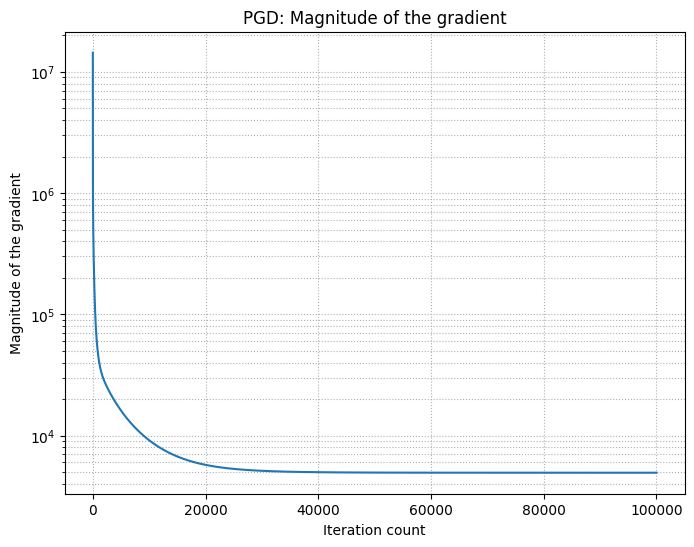

In [16]:
plt.figure(figsize=(8, 6))
plt.plot(hist_pgd)
plt.yscale("log")
plt.xlabel("Iteration count")
plt.ylabel("Magnitude of the gradient")
plt.title("PGD: Magnitude of the gradient")
plt.grid(True, which="both", ls=":")
plt.show()

In [17]:
print("PGD terminal position: [p_e, p_n, p_u] =", X_pgd[:3, -1])
print("PGD terminal velocity: [v_e, v_n, v_u]", X_pgd[3:, -1])
print("gradient:", hist_pgd[-1])

PGD terminal position: [p_e, p_n, p_u] = [ 0.04537941  0.01631159 -0.24657073]
PGD terminal velocity: [v_e, v_n, v_u] [-0.00136476 -0.00049056 -0.10341191]
gradient: 4934.374


2.4 시각화

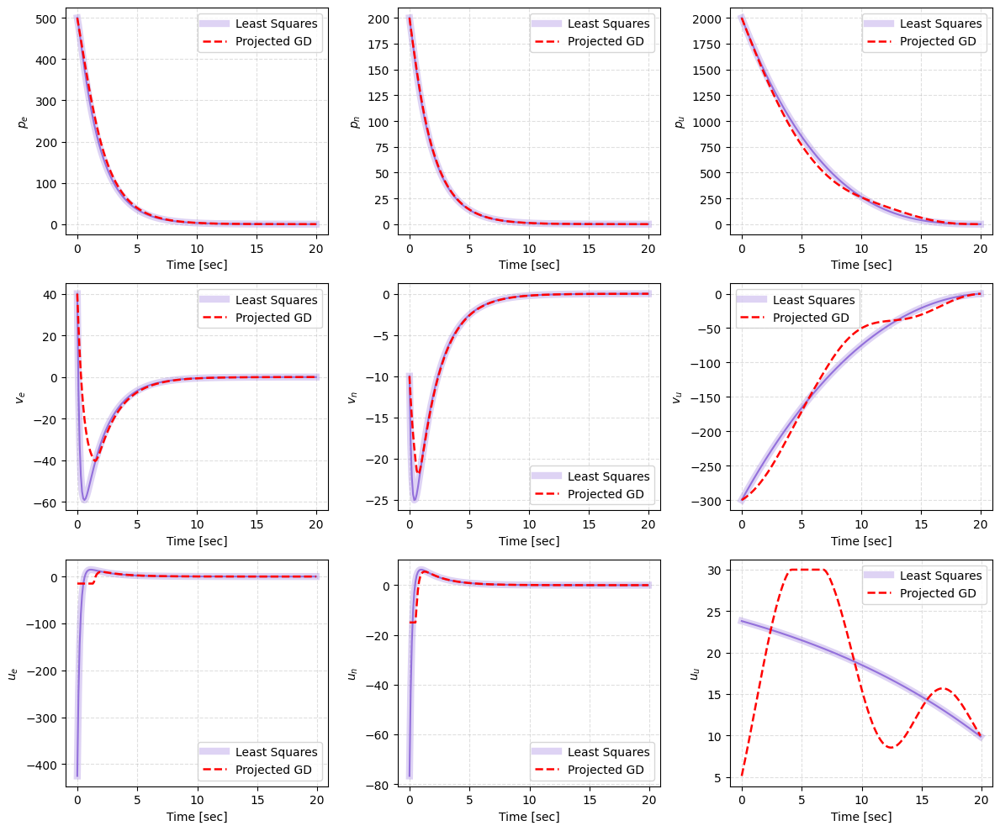

In [18]:
import matplotlib.pyplot as plt

ts_x = ts
ts_u = ts[:-1]

pos_labels = [r"$p_e$", r"$p_n$", r"$p_u$"]
vel_labels = [r"$v_e$", r"$v_n$", r"$v_u$"]
u_labels   = [r"$u_e$", r"$u_n$", r"$u_u$"]

plt.figure(figsize=(12, 10))

# =========================
# 1) Position (X)
# =========================
for i in range(3):
    ax = plt.subplot(3, 3, i+1)
    ax.plot(ts_x, X_ls[i, :], color="mediumpurple", linewidth=6, alpha=0.3, label="Least Squares")
    ax.plot(ts_x, X_ls[i, :], color="mediumpurple", linewidth=1.5)
    ax.plot(ts_x, X_pgd[i, :], "r--", linewidth=1.8, label="Projected GD")

    ax.set_ylabel(pos_labels[i])
    ax.set_xlabel("Time [sec]")
    ax.grid(True, linestyle="--", alpha=0.4)
    ax.legend()

# =========================
# 2) Velocity (X)
# =========================
for i in range(3):
    ax = plt.subplot(3, 3, i+4)
    ax.plot(ts_x, X_ls[3+i, :], color="mediumpurple", linewidth=6, alpha=0.3, label="Least Squares")
    ax.plot(ts_x, X_ls[3+i, :], color="mediumpurple", linewidth=1.5)
    ax.plot(ts_x, X_pgd[3+i, :], "r--", linewidth=1.8, label="Projected GD")

    ax.set_ylabel(vel_labels[i])
    ax.set_xlabel("Time [sec]")
    ax.grid(True, linestyle="--", alpha=0.4)
    ax.legend()

# =========================
# 3) Control Inputs (U)
# =========================
for i in range(3):
    ax = plt.subplot(3, 3, i+7)
    ax.plot(ts_u, U_ls[i, :], color="mediumpurple", linewidth=6, alpha=0.3, label="Least Squares")
    ax.plot(ts_u, U_ls[i, :], color="mediumpurple", linewidth=1.5)
    ax.plot(ts_u, U_pgd[i, :], "r--", linewidth=1.8, label="Projected GD")

    ax.set_ylabel(u_labels[i])
    ax.set_xlabel("Time [sec]")
    ax.grid(True, linestyle="--", alpha=0.4)
    ax.legend()

plt.tight_layout()
plt.show()


In [19]:
print(X_ls[0,:].shape)
print(X_ls[1,:].shape)
print(X_ls[2,:].shape)
print(X_ls[3,:].shape)
print(X_ls[4,:].shape)
print(X_ls[5,:].shape)

(201,)
(201,)
(201,)
(201,)
(201,)
(201,)


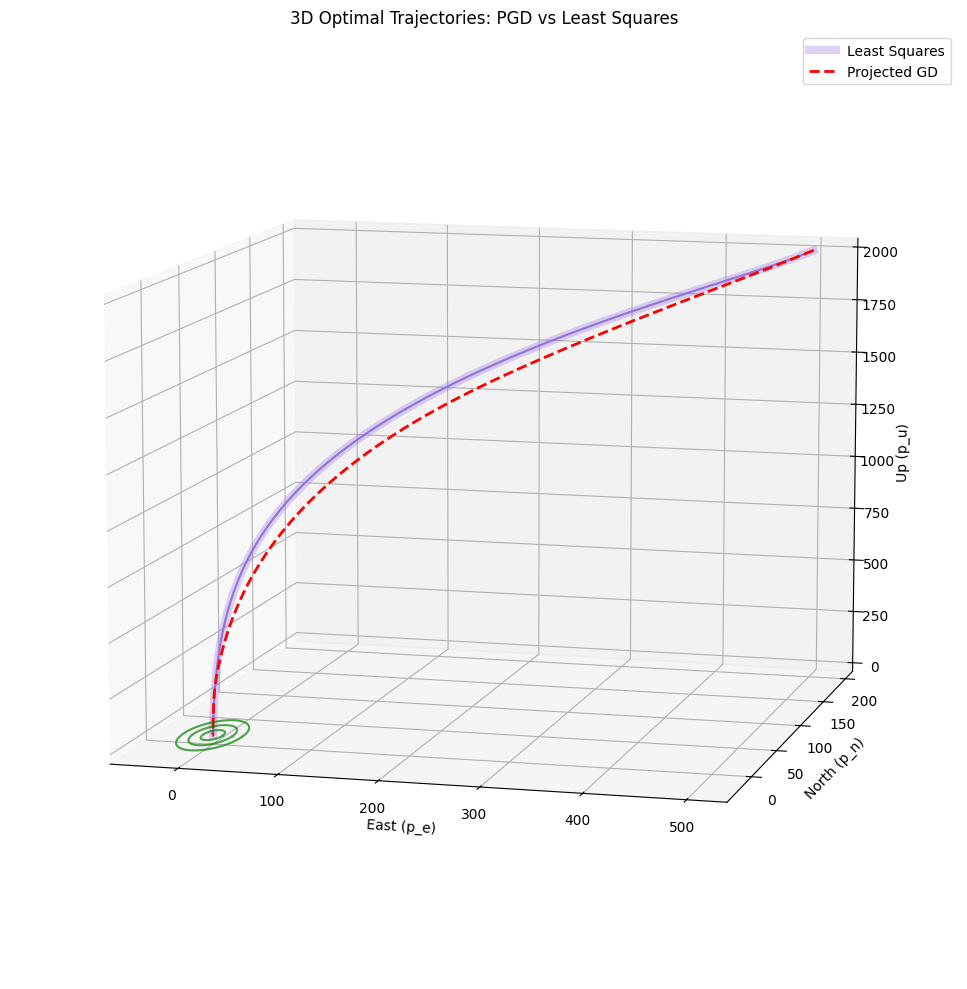

In [20]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import numpy as np

fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')
ax.view_init(elev=10, azim=-75, roll=0)

# ----- LS Trajectory -----
ax.plot(X_ls[0, :], X_ls[1, :], X_ls[2, :],
        color="mediumpurple", linewidth=6, alpha=0.3,
        label="Least Squares")
ax.plot(X_ls[0, :], X_ls[1, :], X_ls[2, :],
        color="mediumpurple", linewidth=1.5)

# ----- PGD Trajectory -----
ax.plot(X_pgd[0, :], X_pgd[1, :], X_pgd[2, :],
        "r--", linewidth=2.0, label="Projected GD")

# ----- Landing pad (circles) -----
theta = np.linspace(0, 2*np.pi, 200)
radii = [10, 20, 30]

for r in radii:
    pe_circle = x_des[0] + r * np.cos(theta)
    pn_circle = x_des[1] + r * np.sin(theta)
    pu_circle = np.zeros_like(theta) + x_des[2]
    ax.plot(pe_circle, pn_circle, pu_circle, "g", alpha=0.7)

# ----- Labels & view -----
ax.set_xlabel("East (p_e)")
ax.set_ylabel("North (p_n)")
ax.set_zlabel("Up (p_u)")
ax.set_title("3D Optimal Trajectories: PGD vs Least Squares")
ax.legend()

plt.tight_layout()
plt.show()


In [21]:
def dyn_residual_norm(X, U, A, B, b):
    # X: (6, N+1) or (6, N) depending on your stacking
    # 여기서는 X[:,0..N], U[:,0..N-1] 가정
    res = X[:,1:] - (A @ X[:,:-1] + B @ U + b[:,None])
    return np.linalg.norm(res)

print("LS dyn residual:", dyn_residual_norm(X_ls, U_ls, A, B, b))
print("PGD dyn residual:", dyn_residual_norm(X_pgd, U_pgd, A, B, b))


LS dyn residual: 63.87910454353457
PGD dyn residual: 72.6949085276195


# 3. QP (Quadratic Programming) by CVXPY

3.1 구속 조건
- 동역학 : $x_{t+1} = Ax_t + Bu_t + b$

동역학을 hard constraint로 두려고 했는데, infeasible로 나와서 잔차로 바꿈
- 제어 입력 제약 :
$
  u_{min} ≤ u_t ≤u_{max}
$
- 고도 제한 :
$
  p_u(t) ≥0
$

- 종단 위치 제약 :
$
  p_{N(des)} = [0, 0, 0]
$

- 종단 속도 제약 : $v_N = 0$

수식 넣자 ㅇㅇ
$$
  \min_{X, U} \sum_{t=0}^{N-1} \left( x_t^{T} Q_t x_t + u_t^{T} R u_t \right)
+ x_N^{T} Q_N x_N
$$

In [22]:
u_min = np.array([-15, -15, 0])
u_max = np.array([ 15,  15, 30])

p_target = np.array([0.0, 0.0, 0.0])   # landing pad position

In [23]:
import cvxpy as cp
import numpy as np

X = cp.Variable((6, N+1))
U = cp.Variable((3, N))

constraints = []
constraints += [X[:, 0] == x0]

# input constraints
for t in range(N):
    constraints += [U[:, t] >= u_min, U[:, t] <= u_max]

# state constraints
constraints += [X[2, :] >= 0]                 # ground
constraints += [X[0:3, N] == p_target]        # terminal position
constraints += [X[3:6, N] == 0]               # terminal velocity

# ---- cost (ONLY ONCE) ----
cost = 0

# soft dynamics
for t in range(N):
    r = X[:, t+1] - (A @ X[:, t] + B @ U[:, t] + b)
    cost += rho * cp.sum_squares(r)

# state/input quadratic cost
for t in range(N):
    cost += cp.quad_form(X[:, t], Q_list[t])
    cost += cp.quad_form(U[:, t], R)


w_du = 100.0
for t in range(N-1):
    cost += w_du * cp.sum_squares(U[:, t+1] - U[:, t])

cost += cp.quad_form(X[:, N], Q_N)

problem = cp.Problem(cp.Minimize(cost), constraints)
problem.solve(solver=cp.CLARABEL, verbose=True)

X_opt = X.value
U_opt = U.value

print("status:", problem.status)
print("U_opt min/max per axis:", U_opt.min(axis=1), U_opt.max(axis=1))


(CVXPY) Jan 05 03:16:18 PM: Your problem has 1806 variables, 1413 constraints, and 0 parameters.
(CVXPY) Jan 05 03:16:18 PM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Jan 05 03:16:18 PM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Jan 05 03:16:18 PM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
(CVXPY) Jan 05 03:16:18 PM: Your problem is compiled with the CPP canonicalization backend.


                                     CVXPY                                     
                                     v1.6.7                                    


(CVXPY) Jan 05 03:16:19 PM: Compiling problem (target solver=CLARABEL).
(CVXPY) Jan 05 03:16:19 PM: Reduction chain: Dcp2Cone -> CvxAttr2Constr -> ConeMatrixStuffing -> CLARABEL
(CVXPY) Jan 05 03:16:19 PM: Applying reduction Dcp2Cone


-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------


(CVXPY) Jan 05 03:16:19 PM: Applying reduction CvxAttr2Constr
(CVXPY) Jan 05 03:16:19 PM: Applying reduction ConeMatrixStuffing
(CVXPY) Jan 05 03:16:20 PM: Applying reduction CLARABEL
(CVXPY) Jan 05 03:16:20 PM: Finished problem compilation (took 1.328e+00 seconds).
(CVXPY) Jan 05 03:16:20 PM: Invoking solver CLARABEL  to obtain a solution.


-------------------------------------------------------------------------------
                                Numerical solver                               
-------------------------------------------------------------------------------
-------------------------------------------------------------
           Clarabel.rs v0.11.1  -  Clever Acronym                

                   (c) Paul Goulart                          
                University of Oxford, 2022                   
-------------------------------------------------------------

problem:
  variables     = 5409
  constraints   = 5016
  nnz(P)        = 3203
  nnz(A)        = 12216
  cones (total) = 2
    :        Zero = 1,  numel = 3615
    : Nonnegative = 1,  numel = 1401

settings:
  linear algebra: direct / qdldl, precision: 64 bit (1 thread)
  max iter = 200, time limit = Inf,  max step = 0.990
  tol_feas = 1.0e-8, tol_gap_abs = 1.0e-8, tol_gap_rel = 1.0e-8,
  static reg : on, ϵ1 = 1.0e-8, ϵ2 = 4.9e-32
  dynamic 

(CVXPY) Jan 05 03:16:20 PM: Problem status: optimal
(CVXPY) Jan 05 03:16:20 PM: Optimal value: 1.328e+07
(CVXPY) Jan 05 03:16:20 PM: Compilation took 1.328e+00 seconds
(CVXPY) Jan 05 03:16:20 PM: Solver (including time spent in interface) took 6.630e-02 seconds


  0  +1.7161e+07  +3.1884e+07  8.58e-01  4.07e-01  1.37e-01  1.00e+00  6.24e+05   ------   
  1  +1.6472e+07  +1.5724e+07  4.76e-02  1.32e-01  3.68e-02  1.33e+05  2.37e+05  9.16e-01  
  2  +1.4098e+07  +1.1111e+07  2.69e-01  6.65e-02  2.29e-02  1.43e+05  1.75e+05  4.15e-01  
  3  +1.3598e+07  +1.2299e+07  1.06e-01  1.83e-02  6.78e-03  5.93e+04  8.61e+04  5.89e-01  
  4  +1.3353e+07  +1.2654e+07  5.52e-02  6.05e-03  2.38e-03  2.17e+04  3.61e+04  6.94e-01  
  5  +1.3292e+07  +1.3075e+07  1.66e-02  1.20e-03  4.86e-04  4.63e+03  8.44e+03  8.22e-01  
  6  +1.3280e+07  +1.3241e+07  2.95e-03  1.21e-04  5.04e-05  5.28e+02  1.00e+03  9.21e-01  
  7  +1.3277e+07  +1.3273e+07  3.57e-04  4.63e-06  1.95e-06  2.89e+01  6.57e+01  9.74e-01  
  8  +1.3277e+07  +1.3277e+07  1.86e-05  5.30e-08  2.23e-08  8.54e-01  2.41e+00  9.90e-01  
  9  +1.3277e+07  +1.3277e+07  1.28e-06  5.92e-10  2.49e-10  4.44e-02  1.40e-01  9.89e-01  
 10  +1.3277e+07  +1.3277e+07  7.85e-08  8.44e-12  3.55e-12  2.30e-03  7.85e-03 

In [24]:
print(
    f'terminal position : (p_e, p_n, p_u)  = '
    f'({X_opt[0,-1]:.4f}, {X_opt[1,-1]:.4f}, {X_opt[2,-1]:.4f})\n'
    f'terminal velocity : (v_e, p_n, p_u) = '
    f'({X_opt[3,-1]:.4f}, {X_opt[4,-1]:.4f}, {X_opt[5,-1]:.4f})'
)

print("terminal position:", X_opt[:3, -1])
print("terminal velocity:", X_opt[3:6, -1])


terminal position : (p_e, p_n, p_u)  = (-0.0000, -0.0000, -0.0000)
terminal velocity : (v_e, p_n, p_u) = (0.0000, 0.0000, 0.0000)
terminal position: [-3.18768953e-18 -1.10203903e-18 -1.24609643e-11]
terminal velocity: [1.57824323e-18 5.47238046e-19 5.13250019e-13]


3.4 해 찾기 - 솔버 이용

# 4. 시각화

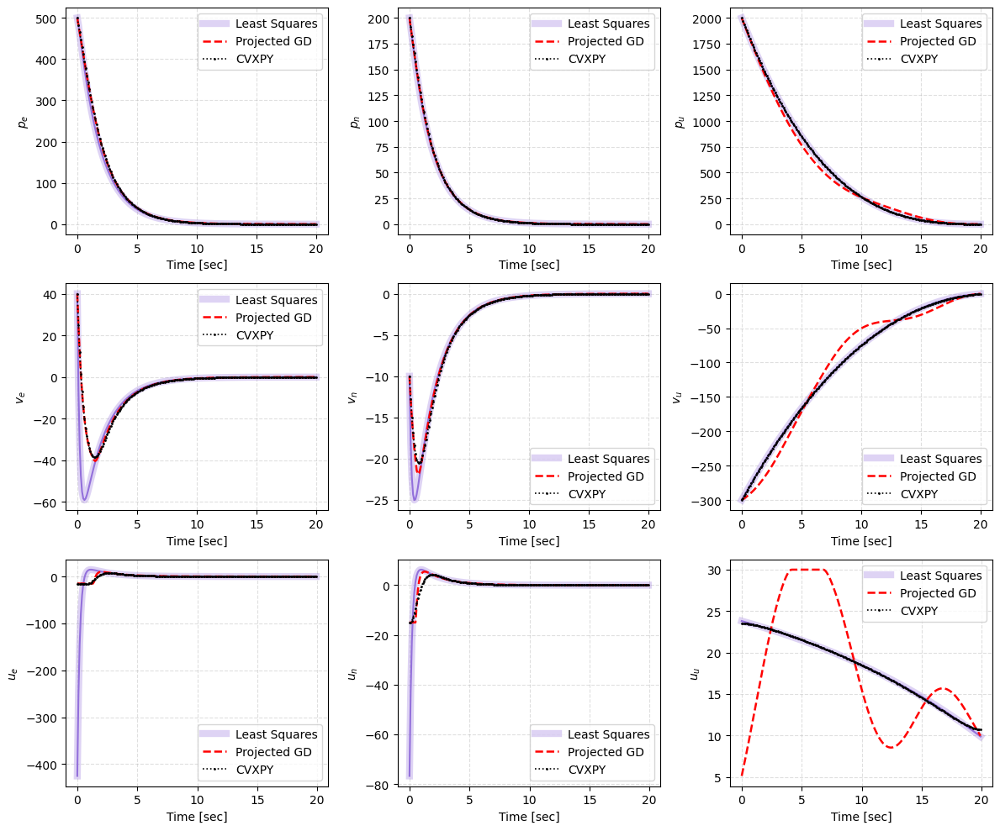

In [38]:
import matplotlib.pyplot as plt

ts_x = ts
ts_u = ts[:-1]

pos_labels = [r"$p_e$", r"$p_n$", r"$p_u$"]
vel_labels = [r"$v_e$", r"$v_n$", r"$v_u$"]
u_labels   = [r"$u_e$", r"$u_n$", r"$u_u$"]

plt.figure(figsize=(12, 10))

# =========================
# 1) Position (X)
# =========================
for i in range(3):
    ax = plt.subplot(3, 3, i+1)

    ax.plot(ts_x, X_ls[i, :],
            color="mediumpurple", linewidth=6, alpha=0.3, label="Least Squares")
    ax.plot(ts_x, X_ls[i, :],
            color="mediumpurple", linewidth=1.5)

    ax.plot(ts_x, X_pgd[i, :],
            "r--", linewidth=1.8, label="Projected GD")

    ax.plot(ts_x, X_opt[i, :],
            "k:", linewidth=1.2, marker="o", markersize=1,
            label="CVXPY")

    ax.set_ylabel(pos_labels[i])
    ax.set_xlabel("Time [sec]")
    ax.grid(True, linestyle="--", alpha=0.4)
    ax.legend()

# =========================
# 2) Velocity (X)
# =========================
for i in range(3):
    ax = plt.subplot(3, 3, i+4)

    ax.plot(ts_x, X_ls[3+i, :],
            color="mediumpurple", linewidth=6, alpha=0.3, label="Least Squares")
    ax.plot(ts_x, X_ls[3+i, :],
            color="mediumpurple", linewidth=1.5)

    ax.plot(ts_x, X_pgd[3+i, :],
            "r--", linewidth=1.8, label="Projected GD")

    ax.plot(ts_x, X_opt[3+i, :],
            "k:", linewidth=1.2, marker="o", markersize=1,
            label="CVXPY")

    ax.set_ylabel(vel_labels[i])
    ax.set_xlabel("Time [sec]")
    ax.grid(True, linestyle="--", alpha=0.4)
    ax.legend()

# =========================
# 3) Control Inputs (U)
# =========================
for i in range(3):
    ax = plt.subplot(3, 3, i+7)

    ax.plot(ts_u, U_ls[i, :],
            color="mediumpurple", linewidth=6, alpha=0.3, label="Least Squares")
    ax.plot(ts_u, U_ls[i, :],
            color="mediumpurple", linewidth=1.5)

    ax.plot(ts_u, U_pgd[i, :],
            "r--", linewidth=1.8, label="Projected GD")

    ax.plot(ts_u, U_opt[i, :],
            "k:", linewidth=1.2, marker="o", markersize=1,
            label="CVXPY")

    ax.set_ylabel(u_labels[i])
    ax.set_xlabel("Time [sec]")
    ax.grid(True, linestyle="--", alpha=0.4)
    ax.legend()

plt.tight_layout()
plt.show()


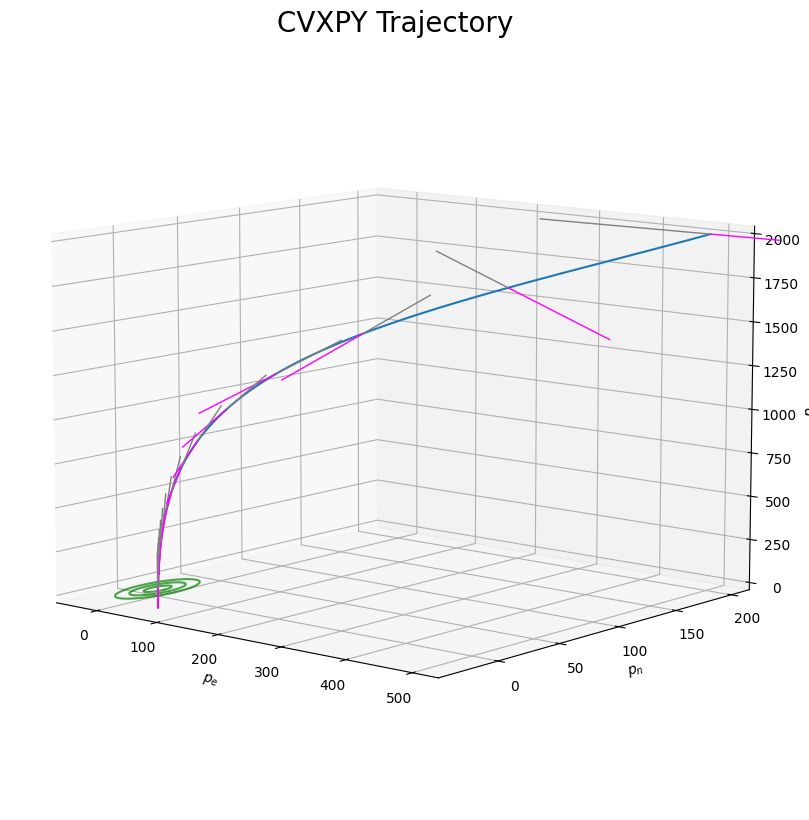

In [51]:
def draw_3d_traj(x1,u1,x2=[],u2=[]):
  fig = plt.figure(figsize=(12,10), dpi=100)
  ax  = fig.add_subplot(projection='3d')
  ax.view_init(elev=10, azim=-50, roll=0)
  #ax.view_init(elev=10, azim=-75, roll=0)
  _ = 10

  N_ = x1.shape[1]-1
  ax.plot(*x1[:3,:])
  if len(x2):
    ax.plot(*x2[:3,:])

  for i in range(0, N_, 10):
    __ = np.linalg.norm(u1[:,i])/200
    __ = max(__, 1e-6)  # <-- safety patch (avoid divide-by-zero)

    ax.quiver(x1[0,i],x1[1,i],x1[2,i],-u1[0,i]*_,-u1[1,i]*_,-u1[2,i]*_,
              color='magenta', linewidths=1, arrow_length_ratio = 0)
    ax.quiver(x1[0,i],x1[1,i],x1[2,i],u1[0,i]/__,u1[1,i]/__,u1[2,i]/__,
              color='gray', linewidths=1, arrow_length_ratio = 0)

    if len(x2):
      __2 = np.linalg.norm(u2[:,i])/200
      __2 = max(__2, 1e-6)  # <-- safety patch

      ax.quiver(x2[0,i],x2[1,i],x2[2,i],-u2[0,i]*_,-u2[1,i]*_,-u2[2,i]*_,
                color='red', linewidths=1, arrow_length_ratio = 0)
      ax.quiver(x2[0,i],x2[1,i],x2[2,i],u2[0,i]/__2,u2[1,i]/__2,u2[2,i]/__2,
                color='black', linewidths=1, arrow_length_ratio = 0)

  # ----- Landing pad (circles) -----
  theta = np.linspace(0, 2*np.pi, 200)
  radii = [10, 20, 30]

  for r in radii:
    pe_circle = x_des[0] + r * np.cos(theta)
    pn_circle = x_des[1] + r * np.sin(theta)
    pu_circle = np.zeros_like(theta) + x_des[2]
    ax.plot(pe_circle, pn_circle, pu_circle, "g", alpha=0.7)

  ax.set_xlabel(r'$p_e$')
  ax.set_ylabel(r'$p_n$')
  ax.set_zlabel(r'$p_u$')
  #ax.axis('equal')
  ax.set_title('CVXPY Trajectory', fontsize = 20)
  plt.show()
  return

draw_3d_traj(X_opt, U_opt)

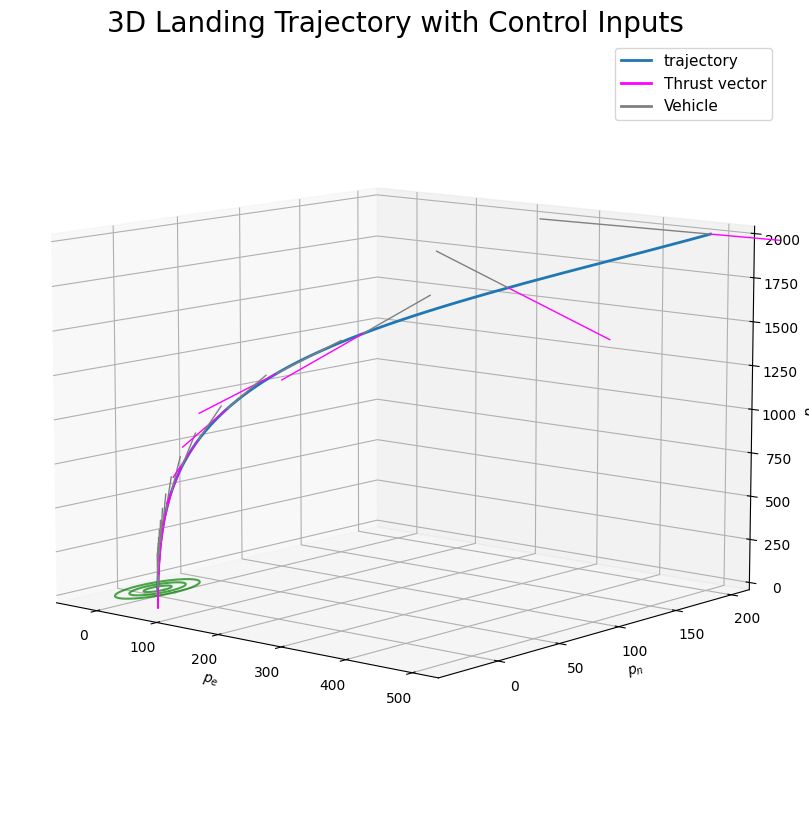

In [54]:
def draw_3d_traj(x1, u1, x2=[], u2=[]):
    fig = plt.figure(figsize=(12,10), dpi=100)
    ax  = fig.add_subplot(projection='3d')
    ax.view_init(elev=10, azim=-50, roll=0)

    _ = 10
    N_ = x1.shape[1]-1

    # ---- Trajectories ----
    ax.plot(*x1[:3,:], linewidth=2, label='Vehicle trajectory (CVXPY)')
    if len(x2):
        ax.plot(*x2[:3,:], color='red', linestyle='--', linewidth=2, label='Vehicle trajectory (Projected GD)')

    # ---- Control inputs (quiver) ----
    for i in range(0, N_, 10):
        __ = np.linalg.norm(u1[:,i])/200
        __ = max(__, 1e-6)

        ax.quiver(x1[0,i], x1[1,i], x1[2,i],
                  -u1[0,i]*_, -u1[1,i]*_, -u1[2,i]*_,
                  color='magenta', linewidths=1, arrow_length_ratio=0)

        ax.quiver(x1[0,i], x1[1,i], x1[2,i],
                  u1[0,i]/__, u1[1,i]/__, u1[2,i]/__,
                  color='gray', linewidths=1, arrow_length_ratio=0)

        if len(x2):
            __2 = np.linalg.norm(u2[:,i])/200
            __2 = max(__2, 1e-6)

            ax.quiver(x2[0,i], x2[1,i], x2[2,i],
                      -u2[0,i]*_, -u2[1,i]*_, -u2[2,i]*_,
                      color='red', linewidths=1, arrow_length_ratio=0)

            ax.quiver(x2[0,i], x2[1,i], x2[2,i],
                      u2[0,i]/__2, u2[1,i]/__2, u2[2,i]/__2,
                      color='black', linewidths=1, arrow_length_ratio=0)

    # ---- Landing pad ----
    theta = np.linspace(0, 2*np.pi, 200)
    radii = [10, 20, 30]
    for r in radii:
        pe_circle = x_des[0] + r * np.cos(theta)
        pn_circle = x_des[1] + r * np.sin(theta)
        pu_circle = np.zeros_like(theta) + x_des[2]
        ax.plot(pe_circle, pn_circle, pu_circle, "g", alpha=0.7)

    # ---- Dummy artists for legend (quiver용) ----
    traj1_proxy = plt.Line2D([0],[0],  lw=2)
    thrust1_proxy = plt.Line2D([0],[0], color='magenta', lw=2)
    dir1_proxy = plt.Line2D([0],[0], color='gray', lw=2)

    handles = [traj1_proxy, thrust1_proxy, dir1_proxy]
    labels  = ['trajectory', 'Thrust vector', 'Vehicle']

    if len(x2):
        traj2_proxy = plt.Line2D([0],[0], color='red', lw=2, linestyle='--')
        thrust2_proxy = plt.Line2D([0],[0], color='red', lw=2)
        dir2_proxy = plt.Line2D([0],[0], color='black', lw=2)

        handles += [traj2_proxy, thrust2_proxy, dir2_proxy]
        labels  += ['Trajectory (Projected GD)',
                    'Thrust vector (Projected GD)',
                    'Thrust direction (Projected GD)']

    ax.legend(handles, labels, loc='upper right', fontsize=11)

    # ---- Labels ----
    ax.set_xlabel(r'$p_e$')
    ax.set_ylabel(r'$p_n$')
    ax.set_zlabel(r'$p_u$')
    ax.set_title('3D Landing Trajectory with Control Inputs', fontsize=20)

    plt.show()
draw_3d_traj(X_opt, U_opt)

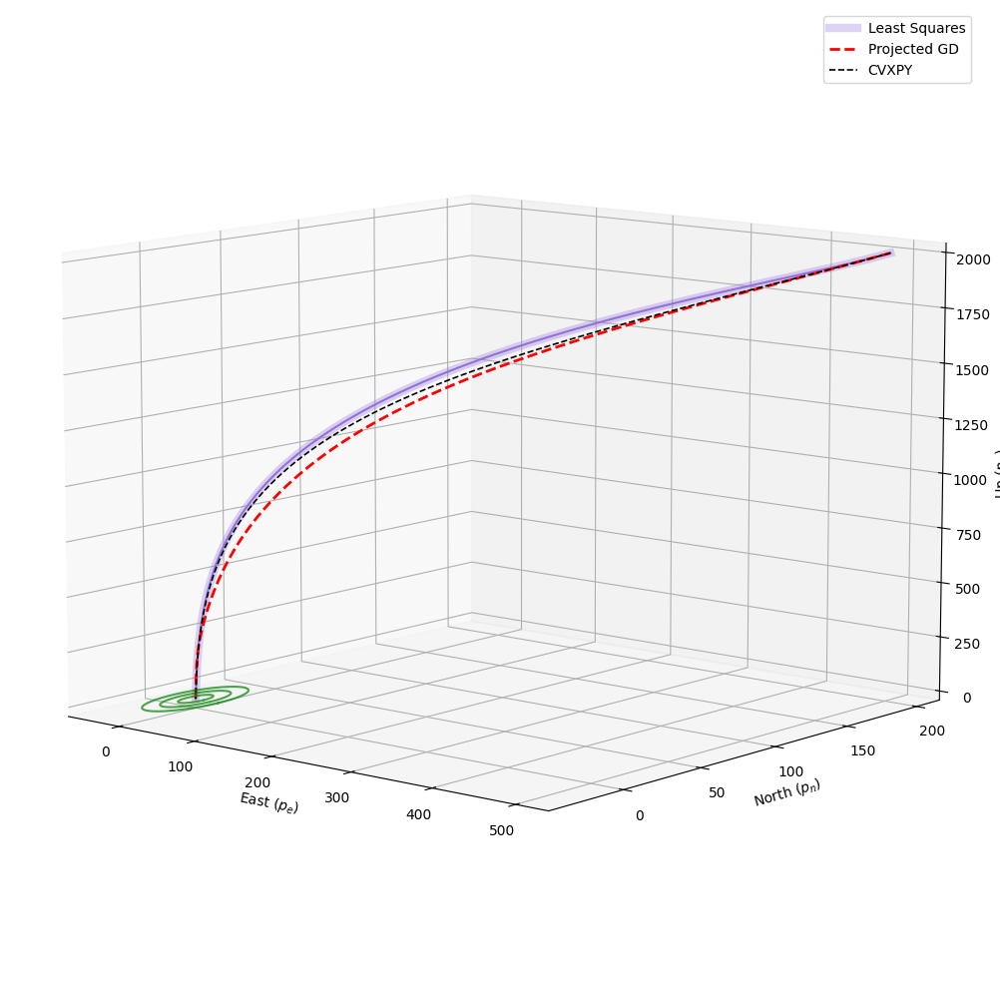

In [34]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import numpy as np

fig = plt.figure(figsize=(12,10))
ax = fig.add_subplot(111, projection='3d')
ax.view_init(elev=10, azim=-50, roll=0)

# ----- LS Trajectory -----
ax.plot(X_ls[0, :], X_ls[1, :], X_ls[2, :],
        color="mediumpurple", linewidth=6, alpha=0.3,
        label="Least Squares")
ax.plot(X_ls[0, :], X_ls[1, :], X_ls[2, :],
        color="mediumpurple", linewidth=1.5)

# ----- PGD Trajectory -----
ax.plot(X_pgd[0, :], X_pgd[1, :], X_pgd[2, :],
        "r--", linewidth=2.0, label="Projected GD")

# ------CVX Trajectory -----
ax.plot(X_opt[0, :], X_opt[1, :], X_opt[2, :], 'k--', linewidth=1.2, label="CVXPY")

# ----- Landing pad (circles) -----
theta = np.linspace(0, 2*np.pi, 200)
radii = [10, 20, 30]

for r in radii:
    pe_circle = x_des[0] + r * np.cos(theta)
    pn_circle = x_des[1] + r * np.sin(theta)
    pu_circle = np.zeros_like(theta) + x_des[2]
    ax.plot(pe_circle, pn_circle, pu_circle, "g", alpha=0.7)

# ----- Labels & view -----
ax.set_xlabel("East $(p_e)$")
ax.set_ylabel("North $(p_n)$")
ax.set_zlabel("Up $(p_u)$")
ax.legend()

plt.tight_layout()
plt.show()


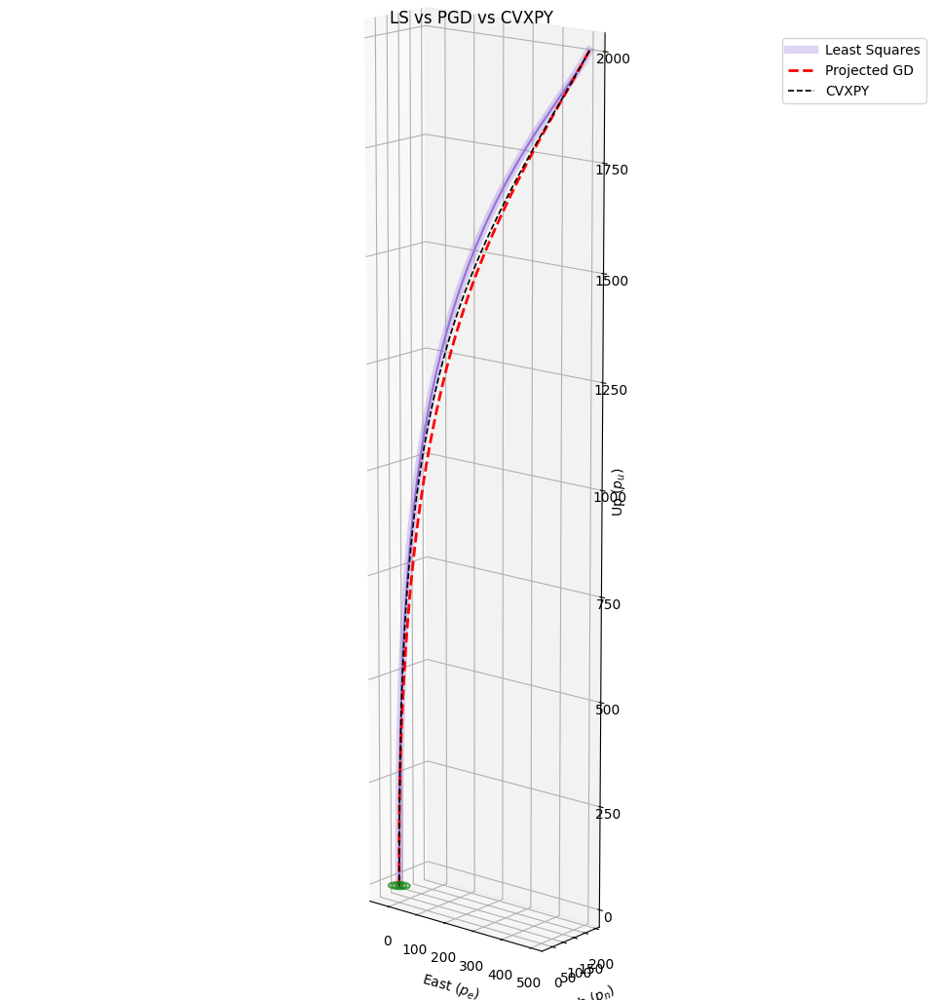

In [36]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import numpy as np

fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')
ax.view_init(elev=15, azim=-50, roll=0)

# =========================
# LS Trajectory
# =========================
ax.plot(X_ls[0,:], X_ls[1,:], X_ls[2,:],
        color="mediumpurple", linewidth=6, alpha=0.3,
        label="Least Squares")
ax.plot(X_ls[0,:], X_ls[1,:], X_ls[2,:],
        color="mediumpurple", linewidth=1.5)

# =========================
# PGD Trajectory
# =========================
ax.plot(X_pgd[0,:], X_pgd[1,:], X_pgd[2,:],
        "r--", linewidth=2.0, label="Projected GD")

# =========================
# OPT Trajectory (NEW)
# =========================
ax.plot(X_opt[0,:], X_opt[1,:], X_opt[2,:],
        'k--', linewidth=1.2,
        label="CVXPY")



# =========================
# Landing pad (circles)
# =========================
theta = np.linspace(0, 2*np.pi, 200)
radii = [10, 20, 30]

for r in radii:
    pe_circle = x_des[0] + r*np.cos(theta)
    pn_circle = x_des[1] + r*np.sin(theta)
    pu_circle = np.zeros_like(theta) + x_des[2]
    ax.plot(pe_circle, pn_circle, pu_circle,
            "g", alpha=0.7)


ax.set_xlabel("East $(p_e)$")
ax.set_ylabel("North $(p_n)$")
ax.set_zlabel("Up $(p_u)$")
ax.set_title("LS vs PGD vs CVXPY")
ax.legend()

ax.set_box_aspect((
    np.ptp(X_opt[0,:]),
    np.ptp(X_opt[1,:]),
    np.ptp(X_opt[2,:])
))

plt.tight_layout()
plt.show()


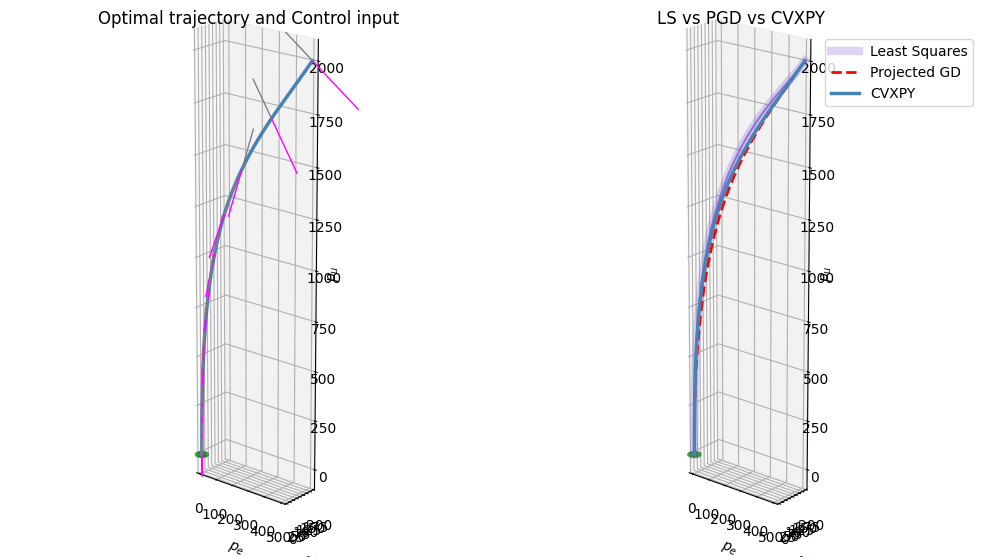

In [37]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import numpy as np

fig = plt.figure(figsize=(10,10), dpi=100)

axL = fig.add_subplot(1, 2, 1, projection='3d')
axR = fig.add_subplot(1, 2, 2, projection='3d')

for ax in (axL, axR):
    ax.view_init(elev=20, azim=-50, roll=0)
    ax.set_xlabel(r'$p_e$')
    ax.set_ylabel(r'$p_n$')
    ax.set_zlabel(r'$p_u$')


theta = np.linspace(0, 2*np.pi, 200)
radii = [10, 20, 30]
for ax in (axL, axR):
    for r in radii:
        pe_circle = x_des[0] + r*np.cos(theta)
        pn_circle = x_des[1] + r*np.sin(theta)
        pu_circle = np.zeros_like(theta) + x_des[2]
        ax.plot(pe_circle, pn_circle, pu_circle, "g", alpha=0.7)


axL.plot(*X_opt[:3,:], color="steelblue", linewidth=2.5)

_ = 10
N_ = X_opt.shape[1] - 1
for i in range(0, N_, 10):
    __ = np.linalg.norm(U_opt[:, i]) / 200
    __ = max(__, 1e-6)

    axL.quiver(X_opt[0,i], X_opt[1,i], X_opt[2,i],
               -U_opt[0,i]*_, -U_opt[1,i]*_, -U_opt[2,i]*_,
               color='magenta', linewidths=1, arrow_length_ratio=0)

    axL.quiver(X_opt[0,i], X_opt[1,i], X_opt[2,i],
               U_opt[0,i]/__, U_opt[1,i]/__, U_opt[2,i]/__,
               color='gray', linewidths=1, arrow_length_ratio=0)

axL.set_title("Optimal trajectory and Control input")

axR.plot(X_ls[0,:], X_ls[1,:], X_ls[2,:],
        color="mediumpurple", linewidth=6, alpha=0.3, label="Least Squares")
axR.plot(X_ls[0,:], X_ls[1,:], X_ls[2,:],
        color="mediumpurple", linewidth=1.5)

axR.plot(X_pgd[0,:], X_pgd[1,:], X_pgd[2,:],
        "r--", linewidth=2.0, label="Projected GD")

axR.plot(X_opt[0,:], X_opt[1,:], X_opt[2,:],
        color="steelblue", linewidth=2.5, label="CVXPY")


axR.set_title("LS vs PGD vs CVXPY")
axR.legend()


P = np.hstack([X_ls[:3,:], X_pgd[:3,:], X_opt[:3,:]])
xmin, xmax = P[0].min(), P[0].max()
ymin, ymax = P[1].min(), P[1].max()
zmin, zmax = P[2].min(), P[2].max()


mx = 0.05 * (xmax - xmin + 1e-9)
my = 0.05 * (ymax - ymin + 1e-9)
mz = 0.05 * (zmax - zmin + 1e-9)

xlim = (xmin - mx, xmax + mx)
ylim = (ymin - my, ymax + my)
zlim = (zmin - mz, zmax + mz)

for ax in (axL, axR):
    ax.set_xlim(*xlim)
    ax.set_ylim(*ylim)
    ax.set_zlim(*zlim)

    ax.set_box_aspect((xlim[1]-xlim[0], ylim[1]-ylim[0], zlim[1]-zlim[0]))

plt.tight_layout()
plt.show()


In [30]:
!pip -q install celluloid

from celluloid import Camera
from matplotlib import rc

def make_3d_anim(x1,u1,x2=[],u2=[],playback_speed=2):
  fig = plt.figure(figsize=(10,10), dpi=100)
  ax = fig.add_subplot(projection='3d')
  ax.view_init(elev=10, azim=-75, roll=0)
  _ = 10

  N_ = x1.shape[1]-1
  camera = Camera(fig)

  for i in range(0, N_, playback_speed):
    ax.plot(*x1[:3,:], alpha=0.2)
    if len(x2):
      ax.plot(*x2[:3,:], alpha=0.2)

    __ = np.linalg.norm(u1[:,i])/200
    __ = max(__, 1e-6)  # <-- safety patch

    ax.plot(x1[0,:i+1],x1[1,:i+1],x1[2,:i+1])
    ax.quiver(x1[0,i],x1[1,i],x1[2,i],-u1[0,i]*_,-u1[1,i]*_,-u1[2,i]*_,
              color='magenta', linewidths=2, arrow_length_ratio = 0)
    ax.quiver(x1[0,i],x1[1,i],x1[2,i],u1[0,i]/__,u1[1,i]/__,u1[2,i]/__,
              color='gray', linewidths=4, arrow_length_ratio = 0)

    if len(x2):
      __2 = np.linalg.norm(u2[:,i])/200
      __2 = max(__2, 1e-6)

      ax.plot(x2[0,:i+1],x2[1,:i+1],x2[2,:i+1])
      ax.quiver(x2[0,i],x2[1,i],x2[2,i],-u2[0,i]*_,-u2[1,i]*_,-u2[2,i]*_,
                color='red', linewidths=2, arrow_length_ratio = 0)
      ax.quiver(x2[0,i],x2[1,i],x2[2,i],u2[0,i]/__2,u2[1,i]/__2,u2[2,i]/__2,
                color='black', linewidths=4, arrow_length_ratio = 0)

    th = np.linspace(0,2*np.pi, 200)
    ax.plot(100*np.cos(th),100*np.sin(th),0,alpha=0.5,color='green')
    ax.plot(200*np.cos(th),200*np.sin(th),0,alpha=0.5,color='green')
    ax.set_xlabel(r'$p_e$')
    ax.set_ylabel(r'$p_n$')
    ax.set_zlabel(r'$p_u$')
    ax.axis('equal')

    camera.snap()

  plt.close()
  anim = camera.animate(blit=False, interval=100)
  rc('animation', html='jshtml')
  return anim

anim = make_3d_anim(X_opt, U_opt, playback_speed=2)
anim
